# Object detection using TensorFlow

In [28]:
# For running inference on the TF-Hub module.
import tensorflow as tf

import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

In [29]:
# For displaying the image.
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [30]:
# For downloading the image from the URL and resizing.
def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [31]:
# For drawing a rectangle on the image.
def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [69]:
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

## A demo using an online picture from the tutorial

Here we are just testing some pictures from the tutorial. We will then adapt this code in order to use our own pictures.

Image downloaded to C:\Users\robbe\AppData\Local\Temp\tmpe9m3d8jb.jpg.


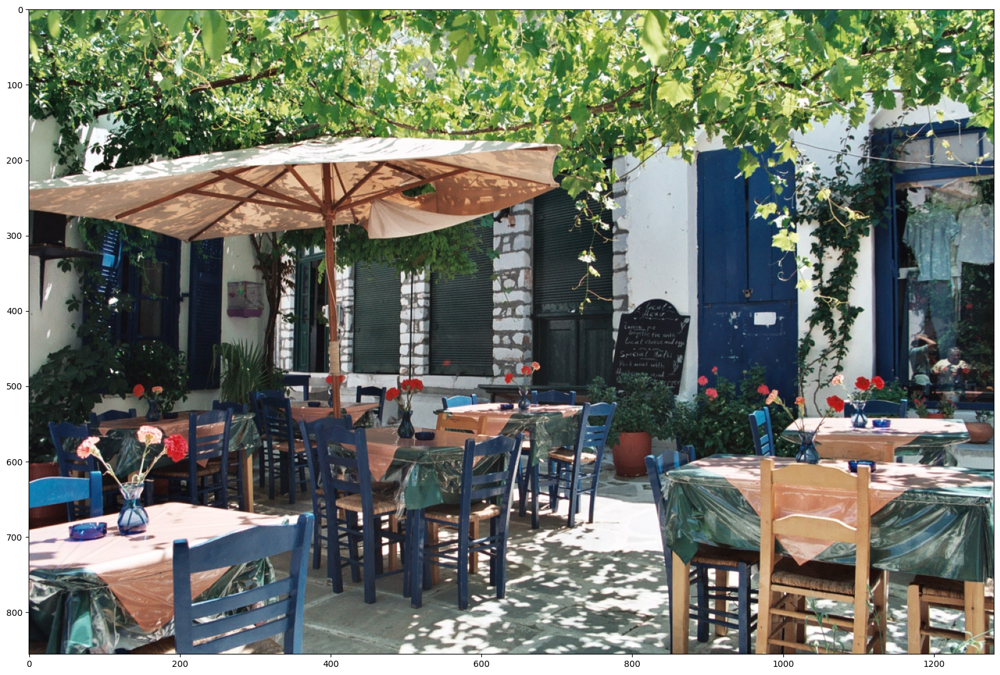

In [33]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg" 
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

In [34]:
# Select a model
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

# Load the module
detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [35]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [68]:
def run_detector(detector, path, dtype=tf.float32):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, dtype)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  197.73649907112122
Font not found, using default font.


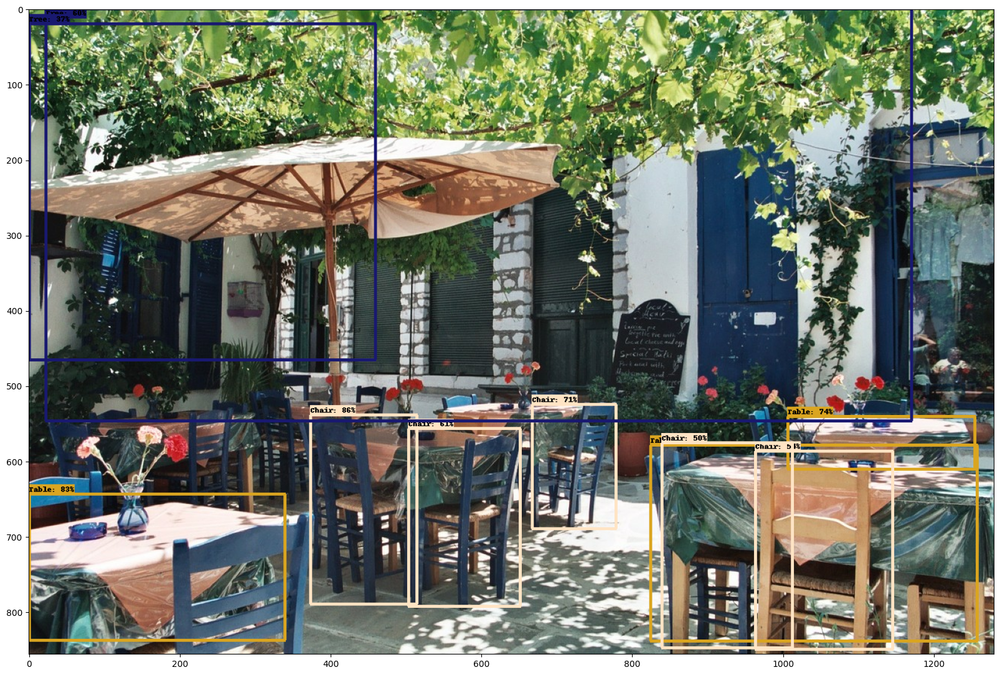

In [37]:
run_detector(detector, downloaded_image_path)

In [38]:
image_urls = [
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  "https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg",
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg",
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  "https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg",
  ]

def detect_img(image_url):
  start_time = time.time()
  image_path = download_and_resize_image(image_url, 640, 480)
  run_detector(detector, image_path)
  end_time = time.time()
  print("Inference time:",end_time-start_time)

Image downloaded to C:\Users\robbe\AppData\Local\Temp\tmp_oua0pqd.jpg.
Found 100 objects.
Inference time:  143.53100204467773
Font not found, using default font.
Inference time: 143.9642255306244


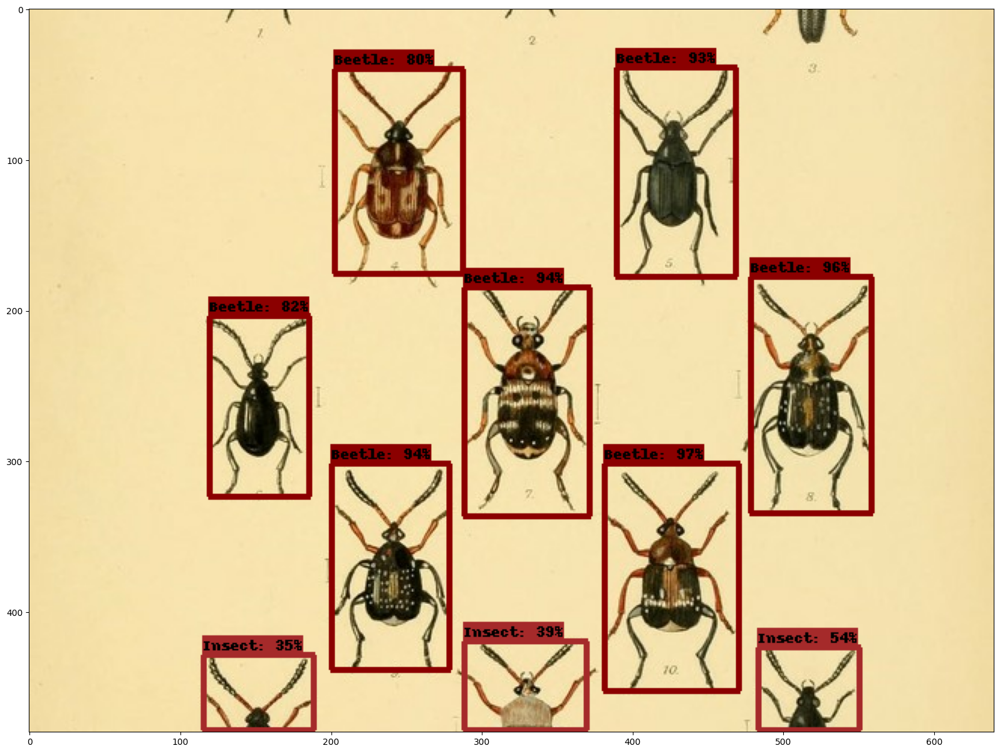

In [39]:
detect_img(image_urls[0])

Image downloaded to C:\Users\robbe\AppData\Local\Temp\tmp3fxe9ol_.jpg.
Found 100 objects.
Inference time:  143.17636585235596
Font not found, using default font.
Inference time: 143.55787014961243


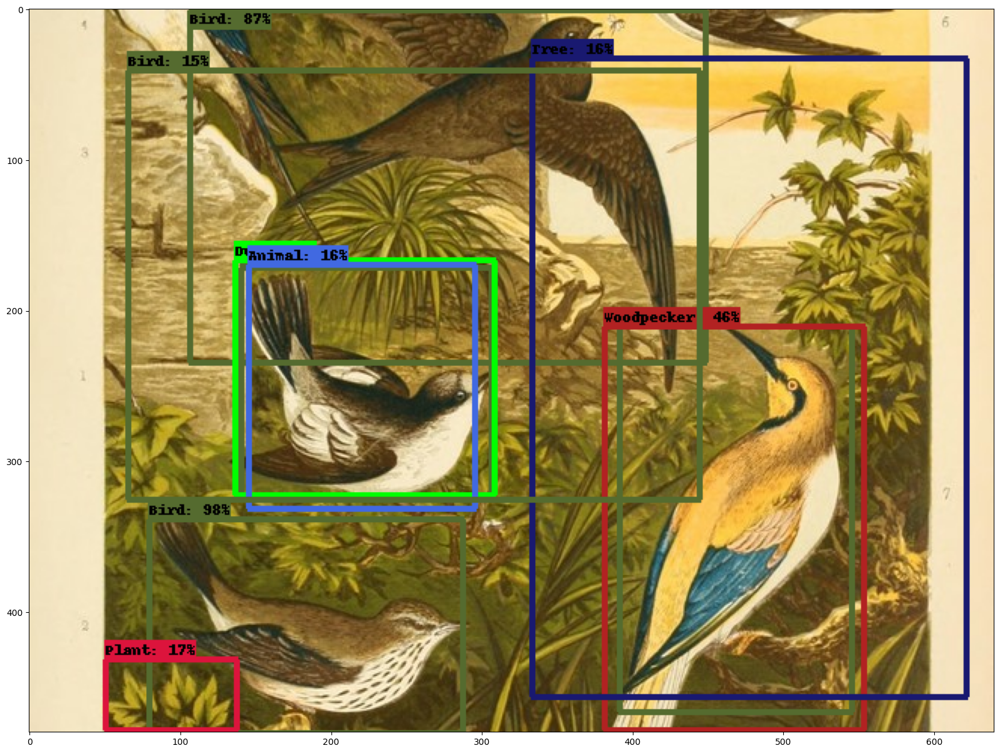

In [40]:
detect_img(image_urls[2])

## Using object detection for our pictures

Now that we have followed the tutorial, we can use our own pictures. We will use the same code as before, but we will adapt it to our needs. We basically need to change the path.

Found 100 objects.
Inference time:  145.02615571022034
Font not found, using default font.


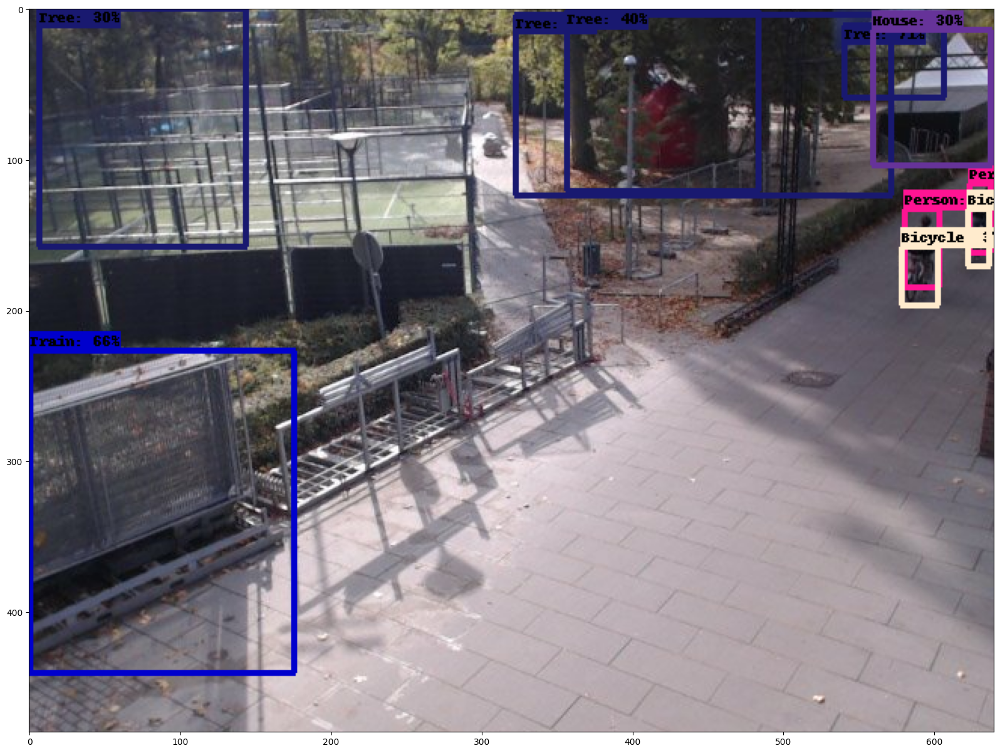

In [41]:
# Picture path
image_path = 'ordered_data/1/1666696488732.jpg'

run_detector(detector, image_path)

Found 100 objects.
Inference time:  134.54656791687012
Font not found, using default font.


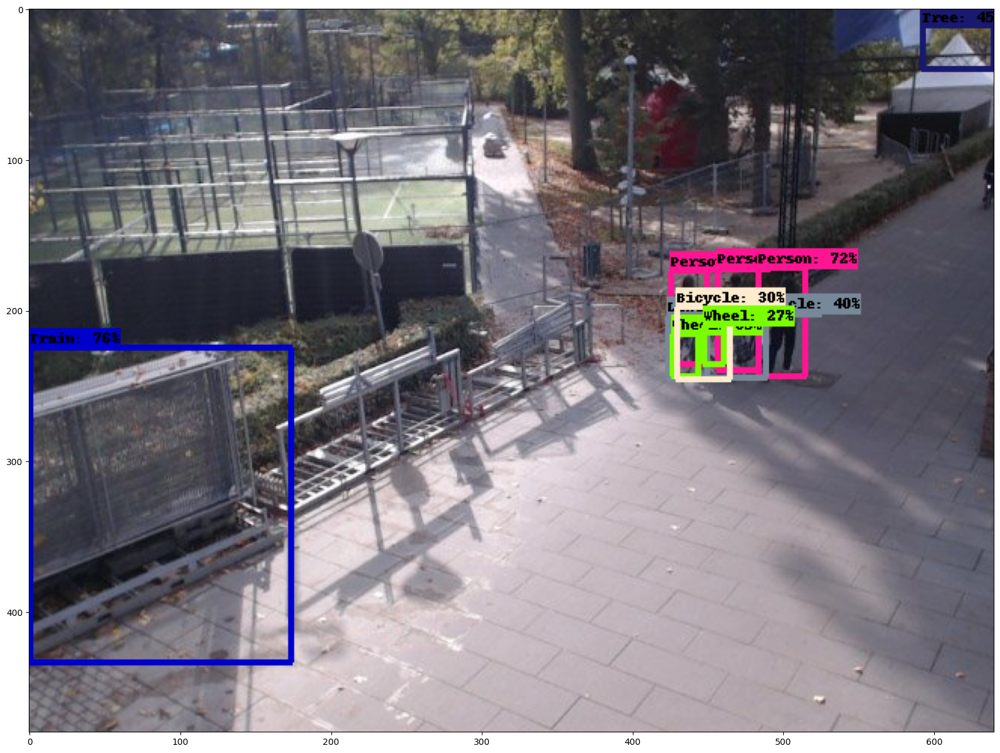

In [42]:
# Picture path
image_path = 'ordered_data/2/1666696866751.jpg'

run_detector(detector, image_path)

The object detection models clearly work, they seem to detect people and bicycles very accurately. For some reason it detects the gates as a train.

Now we will try some other models to see if it changes a lot.

In [43]:
# For resizing the image
def resize_image(path, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  with open(path, 'rb') as f:
        image_data = f.read()
        image_data = BytesIO(image_data)
        pil_image = Image.open(image_data)
        pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
        pil_image_rgb = pil_image.convert("RGB")
        pil_image_rgb.save(filename, format="JPEG", quality=90)
        print("Image downloaded to %s." % filename)
        if display:
            display_image(pil_image)
  return filename

In [70]:
def draw_boxes_2(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())
  font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if (scores[i] >= min_score).any():
      ymin, xmin, ymax, xmax = tuple(boxes[0][i])
      # ymin, xmin, ymax, xmax = tuple(boxes[i])
      # display_str = "{}: {}%".format(class_names[i].decode("ascii"),
      #                                int(100 * scores[i]))
      display_str = "{}: {}%".format(str(class_names[i]) if isinstance(class_names[i],int) else class_names[i], int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

In [80]:
def run_detector_2(detector, path, dtype=tf.float32):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, dtype)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  return result

  # image_with_boxes = draw_boxes_2(
  #     img.numpy(), result["detection_boxes"],
  #     result["detection_classes"], result["detection_scores"])

  # display_image(image_with_boxes)

Here we use the resnet50v1_fpn_512x512_kpts model.

In [44]:
# Select a model
module_handle_2 = "https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1"

# Load the module
detector_2 = hub.load(module_handle_2)

In [81]:
# Picture path
resized = resize_image('ordered_data/2/1666696866751.jpg', 640, 640)
# image_path = 'ordered_data/2/1666696866751.jpg'

result = run_detector_2(detector_2, resized, dtype=tf.uint8)

Image downloaded to C:\Users\robbe\AppData\Local\Temp\tmp4phurmys.jpg.
Found 1 objects.
Inference time:  131.3541488647461


In [83]:
print(result)

{'detection_boxes': array([[[3.65130335e-01, 8.37570012e-01, 5.15632093e-01, 9.02968824e-01],
        [3.67456883e-01, 7.19710469e-01, 4.86432403e-01, 7.73968697e-01],
        [3.65630120e-01, 7.86062360e-01, 5.05375266e-01, 8.42264295e-01],
        [4.22284454e-01, 7.19913423e-01, 5.09470999e-01, 7.83306003e-01],
        [4.21305954e-01, 7.71720409e-01, 5.11978805e-01, 8.48067760e-01],
        [4.56507921e-01, 1.38451462e-03, 9.29626465e-01, 1.84983000e-01],
        [3.24649662e-01, 6.98956609e-01, 3.44301969e-01, 7.34939575e-01],
        [4.22798842e-01, 7.61351764e-01, 5.09959817e-01, 8.19754541e-01],
        [3.10334593e-01, 2.80003637e-01, 3.64547312e-01, 3.23033780e-01],
        [4.25256342e-01, 7.98646450e-01, 5.08739591e-01, 8.52464020e-01],
        [4.15220976e-01, 7.19390929e-01, 5.06370783e-01, 7.74528921e-01],
        [2.97765225e-01, 7.64919400e-01, 3.16570371e-01, 8.05247247e-01],
        [3.73939037e-01, 7.83401847e-01, 5.10644853e-01, 8.38708520e-01],
        [1.7198543